# Machine Learning Model to predic land price in Colombia

The following machine learning model predicts land values in Colombia by analyzing current features that describe land characteristics, along with transactional information recorded at the time of purchase.

In [42]:
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv(r'D:\IGAC_2024\Procesamiento\ML_model\Transaccion_variables_v2.txt',sep=';', encoding='latin1')

In [4]:
df.head()

,ID,TR_LATITUD,TR_LONGITU,CODIGO_PRE,DESTINO_EC,AREA_TERRE,AREA_CONST,VLR_ha_TER,FECHA,Vias_300m,Aguas_300,leyenda,ValorPotencial,Tipo
0,SNR080780057,"10,813547620000000","-74,911580099999995",080780001000000000057000000000,AGROPECUARIO,72900,87,"42304792,810000002384186",2021,NO,NO,2.4.2. Mosaico de pastos y cultivos,67,NaN
1,SNR080780058,"10,811228610000001","-74,908513709999994",080780001000000000058000000000,AGROPECUARIO,57281,286,"53840180,789999999105930",2021,NO,SI,2.3.1. Pastos limpios,67,NaN
2,SNR080780103,"10,812004180000001","-74,908136360000000",080780001000000000103000000000,AGROPECUARIO,57281,52,"53840180,789999999105930",2021,NO,SI,2.3.1. Pastos limpios,67,NaN
3,SNR080780104,"10,812582500000000","-74,907512780000005",080780001000000000104000000000,AGROPECUARIO,57281,0,"53840180,789999999105930",2021,NO,SI,2.3.1. Pastos limpios,67,NaN
4,SNR080780198,"10,815857919999999","-74,913047000000006",080780001000000000198000000000,AGROPECUARIO,3150,0,"219545160,210000008344650",2023,SI,NO,2.4.2. Mosaico de pastos y cultivos,61,NaN


### Cleaning Data

The first step is to check the column data types and identify if there are any null values.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169451 entries, 0 to 169450
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   ID              169451 non-null  object
 1   TR_LATITUD      169451 non-null  object
 2   TR_LONGITU      169451 non-null  object
 3   CODIGO_PRE      169451 non-null  object
 4   DESTINO_EC      169451 non-null  object
 5   AREA_TERRE      169451 non-null  int64 
 6   AREA_CONST      169451 non-null  int64 
 7   VLR_ha_TER      169451 non-null  object
 8   FECHA           169451 non-null  int64 
 9   Vias_300m       169451 non-null  object
 10  Aguas_300       169451 non-null  object
 11  leyenda         169335 non-null  object
 12  ValorPotencial  169381 non-null  object
 13  Tipo            44745 non-null   object
dtypes: int64(3), object(11)
memory usage: 18.1+ MB


In [6]:
# Replace null values in the 'Tipo' column with the string 'Null'
df['Tipo'] = df['Tipo'].fillna('Null')

# Display unique values in the 'Tipo' column
unique_classes = df['Tipo'].unique()
print(unique_classes)

['Null' 'Humedales_version3' 'BosqueSecoTropical' 'Reserva_Biosfera_2023'
 'LEY2' 'Reservas Forestales Protectoras Nacionales'
 'Distritos Regionales de Manejo Integrado'
 'Reserva Natural de la Sociedad Civil' 'Parques Naturales Regionales'
 'Parque Nacional Natural' 'Ã\x81reas de RecreaciÃ³n'
 'Distritos de ConservaciÃ³n de Suelos' 'Paramos_delimitados' 'RAMSAR'
 'Reservas Forestales Protectoras Regionales' 'Santuario de Fauna y Flora'
 'RFPP' 'Manglar']


In [7]:
# Reemplazar comas decimales con puntos y convertir a float
df['VLR_ha_TER'] = df['VLR_ha_TER'].str.replace(',', '.').astype(float)
df['TR_LATITUD'] = df['TR_LATITUD'].str.replace(',', '.').astype(float)
df['TR_LONGITU	'] = df['TR_LONGITU'].str.replace(',', '.').astype(float)
# Verifica que la conversión fue exitosa
print(df['TR_LONGITU'].head())
# Debería mostrar float64

0    -74,911580099999995
1    -74,908513709999994
2    -74,908136360000000
3    -74,907512780000005
4    -74,913047000000006
Name: TR_LONGITU, dtype: object


In [8]:
df.describe()

,TR_LATITUD,AREA_TERRE,AREA_CONST,VLR_ha_TER,FECHA,TR_LONGITU\t
count,169451.000000,169451.000000,169451.000000,1.694510e+05,169451.000000,169451.000000
mean,5.169597,68705.090510,24.799547,6.630964e+07,2019.693528,-74.749434
std,2.461432,138788.999888,87.840221,8.731535e+07,2.561045,1.517595
min,-4.173917,0.000000,0.000000,1.911328e+04,2012.000000,-81.729240
25%,3.252193,3880.000000,0.000000,8.276757e+06,2018.000000,-75.785274
50%,5.265496,16128.000000,0.000000,2.755715e+07,2020.000000,-74.942139
75%,6.401792,59000.000000,0.000000,8.735063e+07,2022.000000,-73.387032
max,13.389068,1000000.000000,6990.000000,3.999994e+08,2024.000000,-67.503264


## Exploratory Analysis and Visualization

Let's explore the data by visualizing the distribution of values in some columns of the dataset, and the relationships betweenprice land hectareaes" and other columns.

We'll use libraries Matplotlib, Seaborn and Plotly for visualizateatsheet

In [9]:
#Import librerias
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

The following settings will improve the default style and font sizes for our charts.

Let's study the distribution of the target "VLR_Ha_Land" column

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


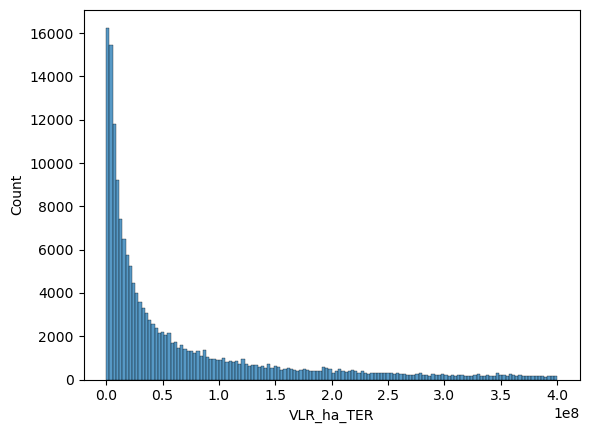

In [10]:
sns.histplot(data=df, x='VLR_ha_TER');

In [11]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

### Potencial Value (VP)VP is a numeric column. The minimum VP in the dataset is 6 and the maximum VP is 92. Thus, we can visualize the distribution of VP using a histogram  and a box plot. We'll use plotly to make the chart interactive.

In [12]:
df.ValorPotencial.describe()

count     169381
unique        23
top           30
freq       33820
Name: ValorPotencial, dtype: object

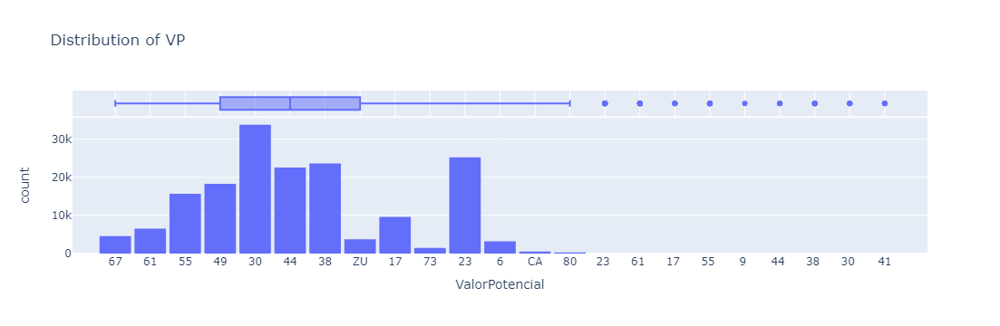

In [13]:
fig = px.histogram(df, 
                   x='ValorPotencial', 
                   
                   marginal='box', 
                   nbins=24, 
                   title='Distribution of VP')
fig.update_layout(bargap=0.1)
fig.show()

The distribution of VP in the dataset is not uniform, except for the VP 23 - 49, which seem to have uniform distribution

Let's explore some other columns

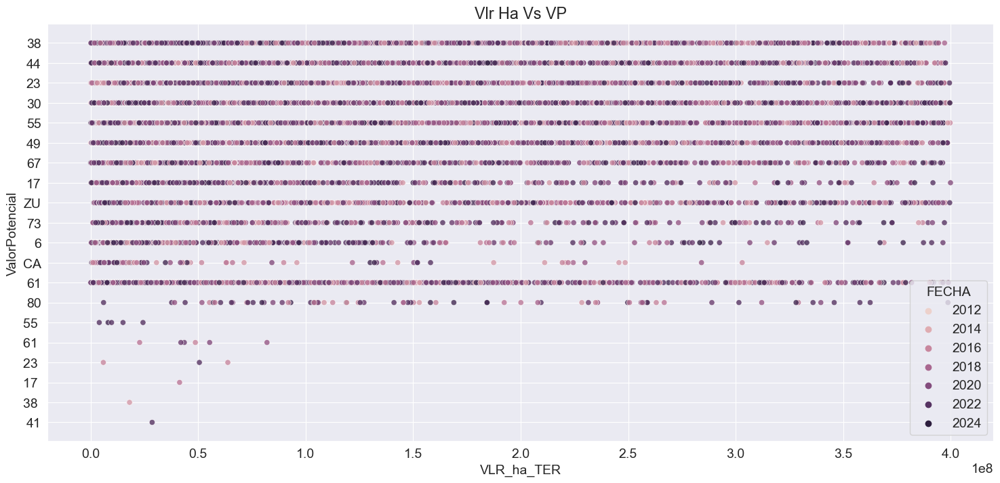

In [14]:
plt.figure(figsize=(18,8))
temp_df = df.sample(40000)
sns.scatterplot(x=temp_df.VLR_ha_TER, y=temp_df.ValorPotencial, hue=temp_df.FECHA, alpha=0.8)
plt.title("Vlr Ha Vs VP")
plt.show()

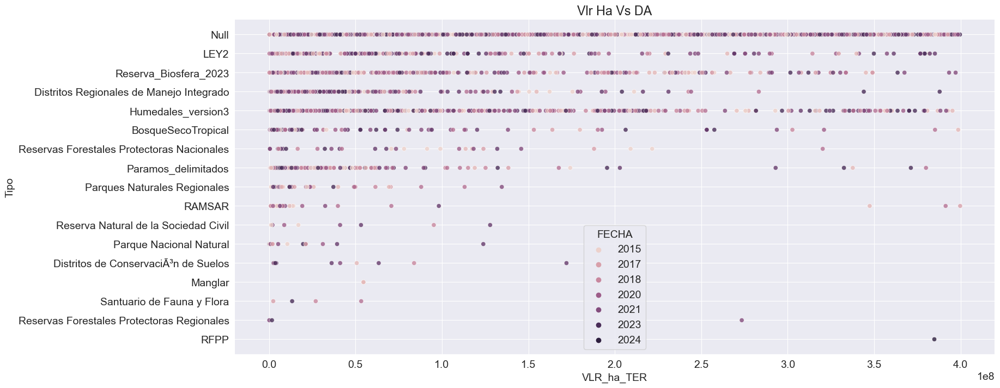

In [15]:
plt.figure(figsize=(18,8))
temp_df=df.sample(10000)
sns.scatterplot(x=temp_df.VLR_ha_TER, y=temp_df.Tipo, hue=temp_df.FECHA, alpha=0.8)
plt.title("Vlr Ha Vs DA")
plt.show()

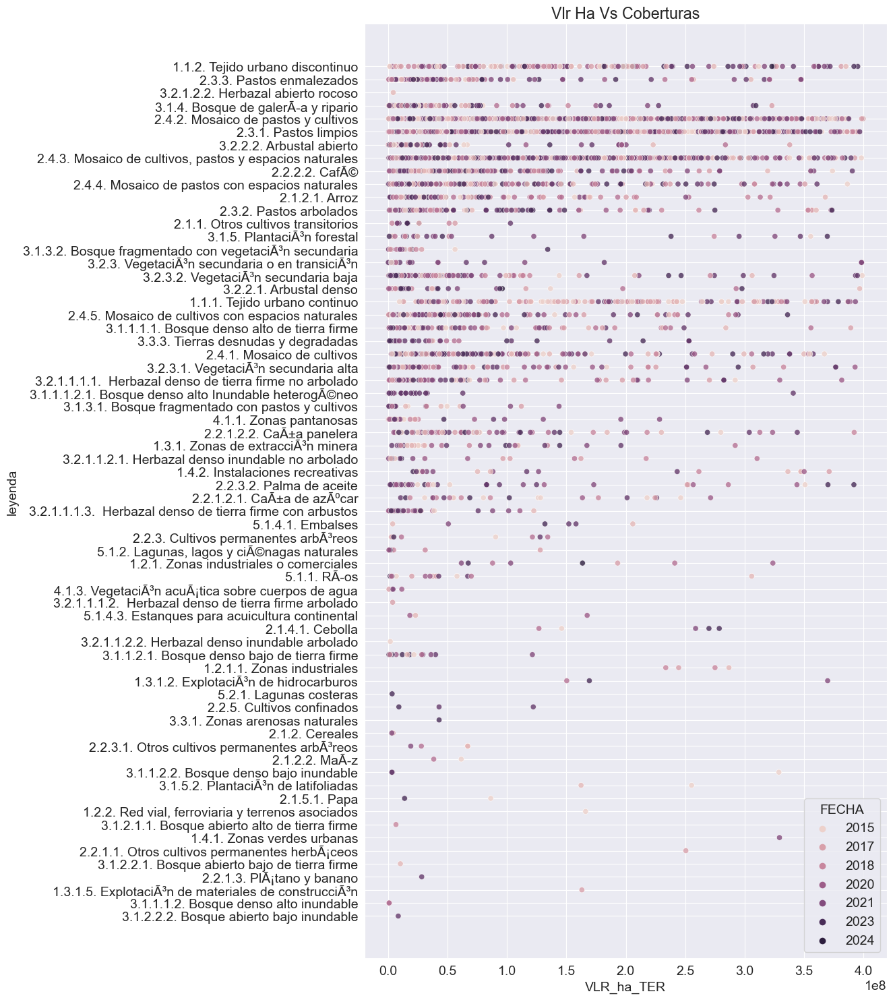

In [16]:
plt.figure(figsize=(10,18))
temp_df=df.sample(10000)
sns.scatterplot(x=temp_df.VLR_ha_TER, y=temp_df.leyenda, hue=temp_df.FECHA, alpha=0.8)
plt.title("Vlr Ha Vs Coberturas")
plt.show()

<Axes: xlabel='VLR_ha_TER', ylabel='Tipo'>

C:\Users\User\anaconda3\Lib\site-packages\IPython\core\events.py:82: UserWarning:

Glyph 129 (\x81) missing from current font.

C:\Users\User\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 129 (\x81) missing from current font.



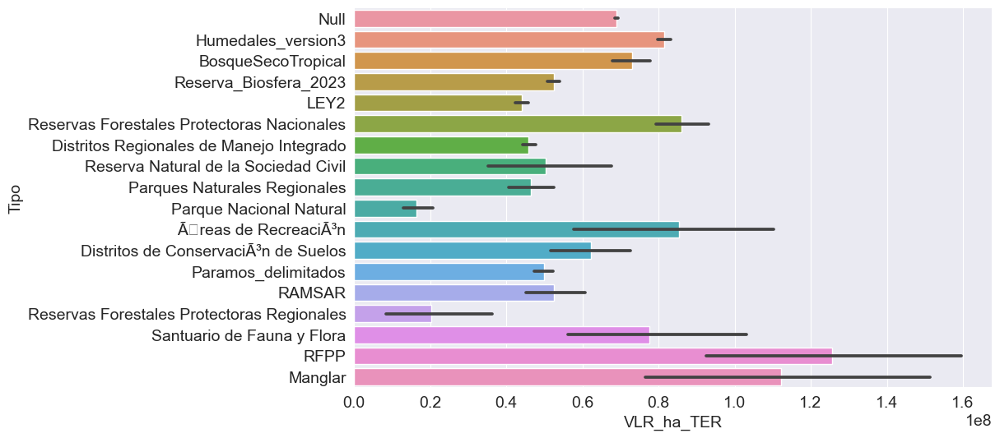

In [17]:
sns.barplot(data=df, x='VLR_ha_TER', y='Tipo')

## Correlation HeatMap

C:\Users\User\anaconda3\Lib\site-packages\seaborn\utils.py:80: UserWarning:

Glyph 9 (	) missing from current font.

C:\Users\User\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 9 (	) missing from current font.



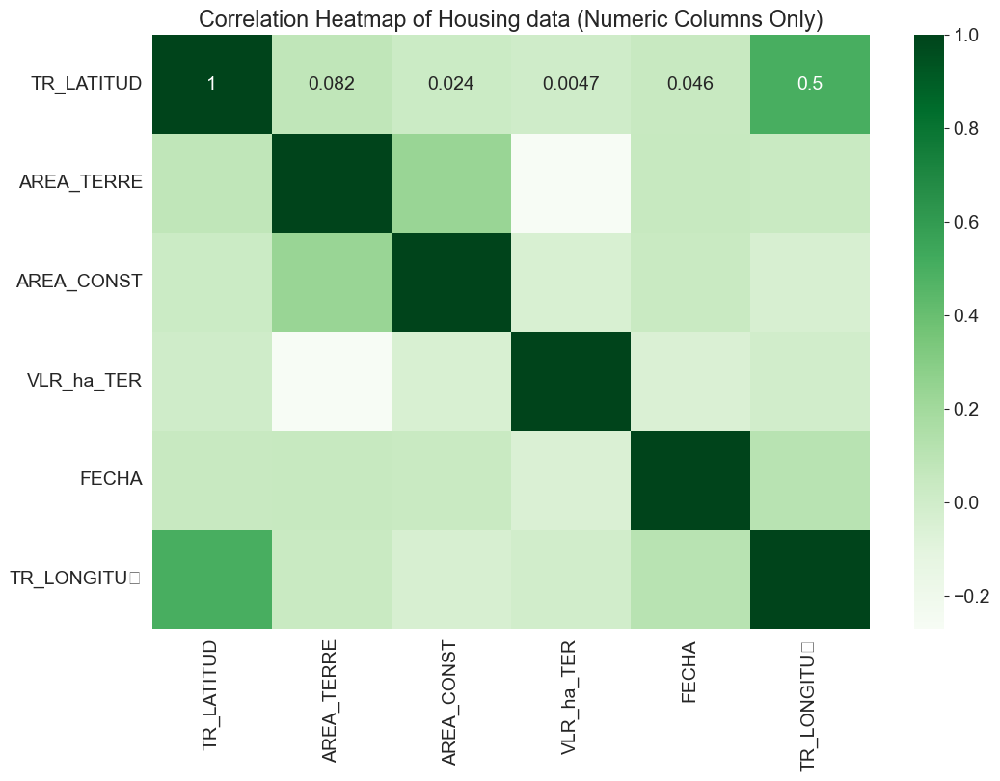

In [18]:
# Seleccionar solo las columnas numéricas
columnas_numericas = df.select_dtypes(include=['int', 'float'])

# Calcular la matriz de correlación solo para las columnas numéricas
correlation_matrix = columnas_numericas.corr()

# Visualizar la matriz de correlación en un heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens')
plt.title('Correlation Heatmap of Housing data (Numeric Columns Only)')
plt.show()

In [19]:
columnas_numericas.corr()['VLR_ha_TER'].sort_values(ascending=False)

VLR_ha_TER      1.000000
TR_LATITUD      0.004715
TR_LONGITU\t   -0.006106
AREA_CONST     -0.037810
FECHA          -0.050729
AREA_TERRE     -0.270650
Name: VLR_ha_TER, dtype: float64

## Step 4 - Create a training/test/validation split and prepare the data for training

<img src="https://i.imgur.com/XZ9aP10.png" width="640">

### Train/Test/Validation Split

The data already contains a test set, which contaiof data after the end of the training set. We can apply a similar strategy to create a validation set. We'll the last 25% of rows for the validation set, after ordering by date

In [20]:
len(df)

169451

In [21]:
df.columns

Index(['ID', 'TR_LATITUD', 'TR_LONGITU', 'CODIGO_PRE', 'DESTINO_EC',
       'AREA_TERRE', 'AREA_CONST', 'VLR_ha_TER', 'FECHA', 'Vias_300m',
       'Aguas_300', 'leyenda', 'ValorPotencial', 'Tipo', 'TR_LONGITU\t'],
      dtype='object')

In [22]:
# Define your features (independent variables) and target (dependent variable)
features = ['TR_LATITUD', 'TR_LONGITU\t', 'Vias_300m', 'Aguas_300',
       'leyenda', 'ValorPotencial', 'Tipo','FECHA','AREA_TERRE','AREA_CONST']
target = ['VLR_ha_TER']

X = df[features]
y = df[target]

In [23]:
from sklearn.model_selection import train_test_split

# Dividir en entrenamiento (70%) y restante (30%)
X_train, X_remaining, y_train, y_remaining = train_test_split(X, y, test_size=0.3, random_state=42)

# Dividir el restante en prueba (15%) y validación (15%)
X_val, X_test, y_val, y_test = train_test_split(X_remaining, y_remaining, test_size=0.5, random_state=42)
print("Tamaño de X_train:", X_train.shape)
print("Tamaño de X_val:", X_val.shape)
print("Tamaño de X_test:", X_test.shape)

Tamaño de X_train: (118615, 10)
Tamaño de X_val: (25418, 10)
Tamaño de X_test: (25418, 10)


Let's also separate out numeric and categorical columns.

In [24]:
df[features].nunique()

TR_LATITUD        156658
TR_LONGITU\t      156662
Vias_300m              2
Aguas_300              2
leyenda               94
ValorPotencial        23
Tipo                  18
FECHA                 13
AREA_TERRE         47881
AREA_CONST           962
dtype: int64

In [25]:
train_inputs = X_train.copy()
train_targets = y_train.copy()

In [26]:
val_inputs = X_val.copy()
val_targets = y_val.copy()

In [27]:
test_inputs = X_test.copy()

Note that some columns can be treated as both numeric and categorical

In [28]:
numeric_cols = ['TR_LATITUD', 'TR_LONGITU\t','AREA_TERRE','AREA_CONST']
categorical_cols = ['Vias_300m', 'Aguas_300','leyenda', 'ValorPotencial', 'Tipo','FECHA']


### Imputation, Scaling and Encode

Let's impute missing data from numeric columns and scale the values to the $(0, 1)$ range. 

In [29]:
from sklearn.impute import SimpleImputer

In [30]:
imputer = SimpleImputer(strategy='mean').fit(train_inputs[numeric_cols])

In [31]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

Let's also scale the values to the $(0, 1)$ range.

In [32]:
from sklearn.preprocessing import MinMaxScaler

In [33]:
scaler = MinMaxScaler().fit(train_inputs[numeric_cols])

In [34]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

Finally, let's encode categorical columns as one-hot vectors.

In [35]:
from sklearn.preprocessing import OneHotEncoder

In [36]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore').fit(train_inputs[categorical_cols])
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

In [37]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

C:\Users\User\AppData\Local\Temp\ipykernel_11468\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\User\AppData\Local\Temp\ipykernel_11468\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\User\AppData\Local\Temp\ipykernel_11468\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

Let's now extract out the numeric data.

In [38]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

## Step 5 - Create quick & easy baseline models to benchmark future models

<img src="https://i.imgur.com/1DLgiEz.png" width="640">

A quick baseline model helps establish the minimum score any ML model you train should achieve.


### Fixed/Random Guess

Let's define a model that always returns the mean value of Sales as the prediction.

In [44]:
def return_mean(inputs):
    return np.full(len(inputs), df.VLR_ha_TER.mean())

In [45]:
train_preds = return_mean(X_train)

In [46]:
train_preds

array([66309644.76035523, 66309644.76035523, 66309644.76035523, ...,
       66309644.76035523, 66309644.76035523, 66309644.76035523])

Let's evaluate this to using the RMSE score.

In [47]:
from sklearn.metrics import mean_squared_error

In [48]:
mean_squared_error(train_preds, train_targets, squared=False)

87408939.78315094

The model is off by about $87.408.939 on average.

Let's try another model, which makes a random guess between the lowest and highest sale.

In [51]:
def guess_random(inputs):
    lo, hi = df.VLR_ha_TER.min(), df.VLR_ha_TER.max()
    return np.random.random(len(inputs)) * (hi - lo) + lo

In [52]:
train_preds = guess_random(X_train)
train_preds

array([2.79233401e+05, 1.41952285e+08, 1.62324858e+08, ...,
       8.59225383e+07, 2.13212680e+08, 1.93550440e+08])

In [53]:
mean_squared_error(train_preds, train_targets, squared=False)

197161116.481416

Clearly, this model is much worse.

### Baseline ML model

Let's train a simple `LinearRegression` model, with no customization.

### Baseline ML model

Let's train a simple `LinearRegression` model, with no customization.

In [56]:
from sklearn.linear_model import LinearRegression

In [57]:
linreg = LinearRegression()

In [58]:
linreg.fit(X_train, train_targets)

LinearRegression()

`model.fit` uses the following workflow for training the model ([source](https://www.deepnetts.com/blog/from-basic-machine-learning-to-deep-learning-in-5-minutes.html)):

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.  
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.


<img src="https://www.deepnetts.com/blog/wp-content/uploads/2019/02/SupervisedLearning.png" width="480">


The we have fit the model, the model can now be used to make predictions. Note that the parameters of the model will not be updated during prediction.

In [60]:
train_preds = linreg.predict(X_train)
train_preds

array([[81182720.],
       [46661632.],
       [45826048.],
       ...,
       [63422464.],
       [52838400.],
       [62177280.]])

In [61]:
mean_squared_error(train_preds, train_targets, squared=False)

78628103.90909715

In [62]:
val_preds = linreg.predict(X_val)
val_preds

array([[69124096.],
       [55427072.],
       [54411264.],
       ...,
       [55181312.],
       [21676032.],
       [85770240.]])

In [63]:
mean_squared_error(val_preds, val_targets, squared=False)

3.0252692529220304e+16

## Step 6 - Pick a strategy, train a model & tune hyperparameters

<img src="https://i.imgur.com/aRuE5mw.png" width="640">


### Systematically Exploring Modeling Strategies

Scikit-learn offers the following cheatsheet to decide which model to pick.

![](https://scikit-learn.org/stable/_static/ml_map.png)


Here's the general strategy to follow:

- Find out which models are applicable to the problem you're solving.
- Train a basic version for each type of model that's applicable
- Identify the modeling approaches that work well and tune their hypeparameters
- [Use a spreadsheet](https://docs.google.com/spreadsheets/d/1S42lnklqdj4hS3BohffyvZVJOFBZJ61VDiHLMuf2zBw/edit?usp=sharing) to keep track of your experiments and results.

Let's define a function `try_model`, which takes a model, then performs training and evaluation.

In [64]:
def try_model(model):
    # Fit the model
    model.fit(X_train, train_targets)
    
    # Generate predictions
    train_preds = model.predict(X_train)
    val_preds = model.predict(X_val)
    
    # Compute RMSE
    train_rmse = mean_squared_error(train_targets, train_preds, squared=False)
    val_rmse = mean_squared_error(val_targets, val_preds, squared=False)
    return train_rmse, val_rmse

### Linear Models

Read about linear models here: https://scikit-learn.org/stable/modules/linear_model.html

In [65]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, SGDRegressor

In [66]:
try_model(LinearRegression())

(78628103.90909715, 3.0252692529220304e+16)

In [67]:
try_model(Ridge())

(78629259.12115788, 78331669.80164155)

In [68]:
try_model(Lasso())

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.904e+19, tolerance: 9.063e+16



(78627050.71843234, 78331675.23192522)

In [69]:
try_model(ElasticNet())

(85398391.78955555, 84785062.12366751)

In [70]:
try_model(SGDRegressor())

C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



(78738654.39278337, 78396321.76905599)

### Tree Based Models

* Decision trees: https://scikit-learn.org/stable/modules/tree.html
* Random forests and gradient boosting: https://scikit-learn.org/stable/modules/ensemble.html

In [71]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

In [72]:
tree = DecisionTreeRegressor(random_state=42)
try_model(tree)

(4399682.853269909, 76955013.55493829)

Seems like the decision tree performs much better than linear models.

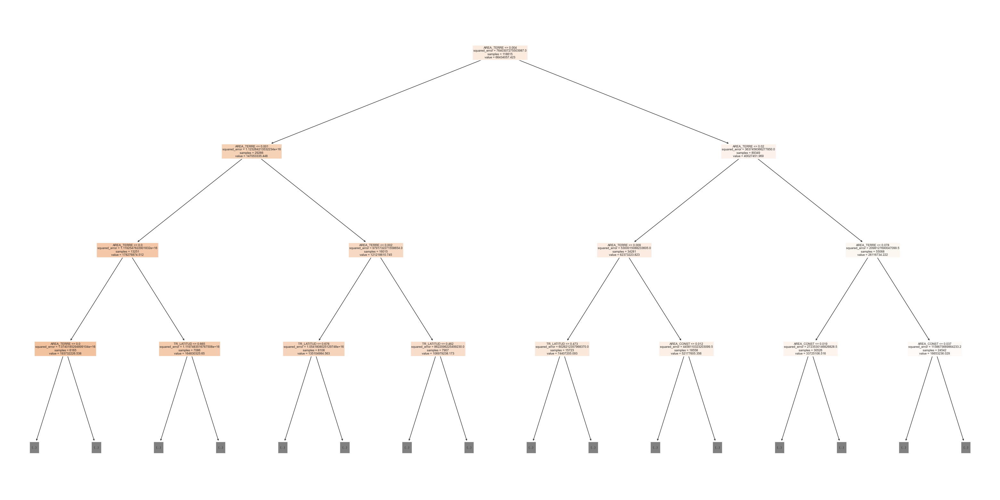

In [73]:
plt.figure(figsize=(40, 20))
plot_tree(tree, max_depth=3, filled=True, feature_names=numeric_cols+encoded_cols);

Let's try a random forest.

In [75]:
from sklearn.ensemble import RandomForestRegressor

In [76]:
%%time
rf = RandomForestRegressor(random_state=42, n_jobs=-1)
try_model(rf)

C:\Users\User\AppData\Local\Temp\ipykernel_11468\3855668059.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



CPU times: total: 7min 52s
Wall time: 44.3 s


(21497991.935626063, 55753914.35625322)

## Step 8 - Interpret models, study individual predictions & present your findings

<img src="https://i.imgur.com/9axhOrA.png" width="640">

### Feature Importance

You'll need to explain why your model returns a particular result. Most scikit-learn models offer some kind of "feature importance" score.

In [78]:
rf.feature_importances_

array([1.48742246e-01, 1.49294915e-01, 4.41651656e-01, 3.05812199e-02,
       4.99804371e-03, 5.05808692e-03, 5.33328856e-03, 5.40908112e-03,
       2.83172209e-03, 3.52938868e-03, 6.39392872e-04, 8.23977341e-05,
       2.12155988e-04, 5.53322177e-06, 1.58730643e-05, 6.03594415e-04,
       1.17260453e-04, 7.51989620e-07, 1.06574086e-07, 3.98109368e-06,
       6.83441148e-07, 7.41360547e-05, 1.39030850e-03, 1.18683283e-08,
       3.25198479e-05, 1.12464875e-04, 1.45409452e-06, 1.38913646e-03,
       1.10726034e-04, 2.66419329e-07, 2.26066856e-07, 2.44465382e-04,
       1.35287530e-07, 1.54916242e-05, 2.77348460e-05, 1.02738154e-05,
       8.65392343e-08, 1.62328284e-03, 7.39394802e-04, 9.06720700e-05,
       1.66129164e-03, 6.84982564e-05, 1.61456368e-03, 1.07932377e-03,
       5.34802364e-05, 2.19696293e-04, 6.99491860e-03, 2.23908451e-03,
       1.87013376e-03, 2.76658971e-03, 7.68770346e-03, 5.72321048e-03,
       3.24967862e-03, 1.47998955e-03, 7.17842461e-04, 6.25404764e-06,
      

In [79]:
importance_df = pd.DataFrame({ 
    'feature': numeric_cols+encoded_cols, 
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)
importance_df.head(10)

,feature,importance
2,AREA_TERRE,0.441652
1,TR_LONGITU\t,0.149295
0,TR_LATITUD,0.148742
3,AREA_CONST,0.030581
150,FECHA_2021,0.011714
151,FECHA_2022,0.009414
152,FECHA_2023,0.008884
148,FECHA_2019,0.008651
111,ValorPotencial_55,0.007886
50,leyenda_2.4.2. Mosaico de pastos y cultivos,0.007688


C:\Users\User\anaconda3\Lib\site-packages\IPython\core\events.py:82: UserWarning:

Glyph 9 (	) missing from current font.

C:\Users\User\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 9 (	) missing from current font.



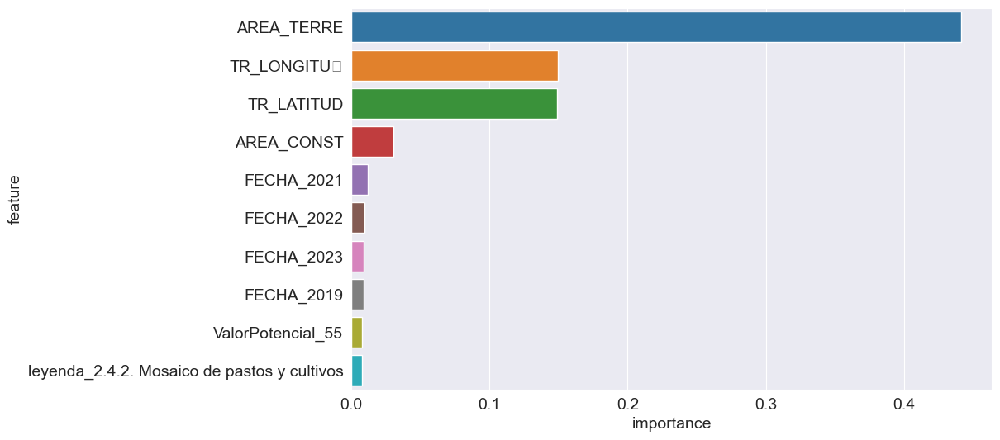

In [80]:
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

## Conclusion
The model had high results with Decision three regression model because its rms just over 4M colombia pesos However Its a high bisses. This model has to be eject a regional scale than national there are a high diferences along Country